# stLearn Analysis approaches
This notebook outlines a pipeline for the loading and analysis of Spatial Resolved Transcriptomics data using in-situ sequencing techniques such as 10xVisium. The data analysed with consist of both 10xVisium for multi-cellular splot resolution data along with Single cell resolution sequencing data from Xenium

## Data Loading and Preparation

In [ ]:
#IMPORTS 
import stlearn as st
from pathlib import Path
st.settings.set_figure_params(dpi=120)

: 

In [2]:
WD_PATH = "C:/Users/rdbra/Documents/honours_2024/code_base/ST_honours_2024/basicAnalysis/"
BASE_PATH = Path(WD_PATH+"data/vis_mouse_cor")

#Spot tile is the result of image pre-processing
TILE_PATH = Path("/tmp/tiles")
TILE_PATH.mkdir(parents=True, exist_ok=True)

# output path
OUT_PATH = Path(WD_PATH+"sequencedSTanalysis/stLearnPlot/")
OUT_PATH.mkdir(parents=True, exist_ok=True)

In [3]:
data = st.Read10X(BASE_PATH)

c:\Users\rdbra\anaconda3\envs\stlearn\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
st.pp.filter_genes(data, min_cells=1)
st.pp.normalize_total(data)
st.pp.log1p(data)

Normalization step is finished in adata.X
Log transformation step is finished in adata.X


In [5]:
st.pp.tiling(data, TILE_PATH)
st.pp.extract_feature(data)

Tiling image: 100%|██████████ [ time left: 00:00 ]
c:\Users\rdbra\anaconda3\envs\stlearn\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
c:\Users\rdbra\anaconda3\envs\stlearn\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
c:\Users\rdbra\anaconda3\envs\stlearn\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
c:\Users\rdbra\a

A local file was found, but it seems to be incomplete or outdated because the md5 file hash does not match the original value of a268eb855778b3df3c7506639542a6af so we will re-download the data.
94658560/94653016 [==============================] - 5s 0us/step


Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!


## Clustering

In [6]:
st.em.run_pca(data, n_comps=50)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


In [7]:
data_SME = data.copy()
st.spatial.SME.SME_normalize(data_SME, use_data="raw")
data_SME.X = data_SME.obsm['raw_SME_normalized']
st.pp.scale(data_SME)
st.em.run_pca(data_SME, n_comps=50)

Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by SME is added to adata.obsm['raw_SME_normalized']
Scale step is finished in adata.X
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Applying Kmeans cluster ...
Kmeans cluster is done! The labels are stored in adata.obs["kmeans"]


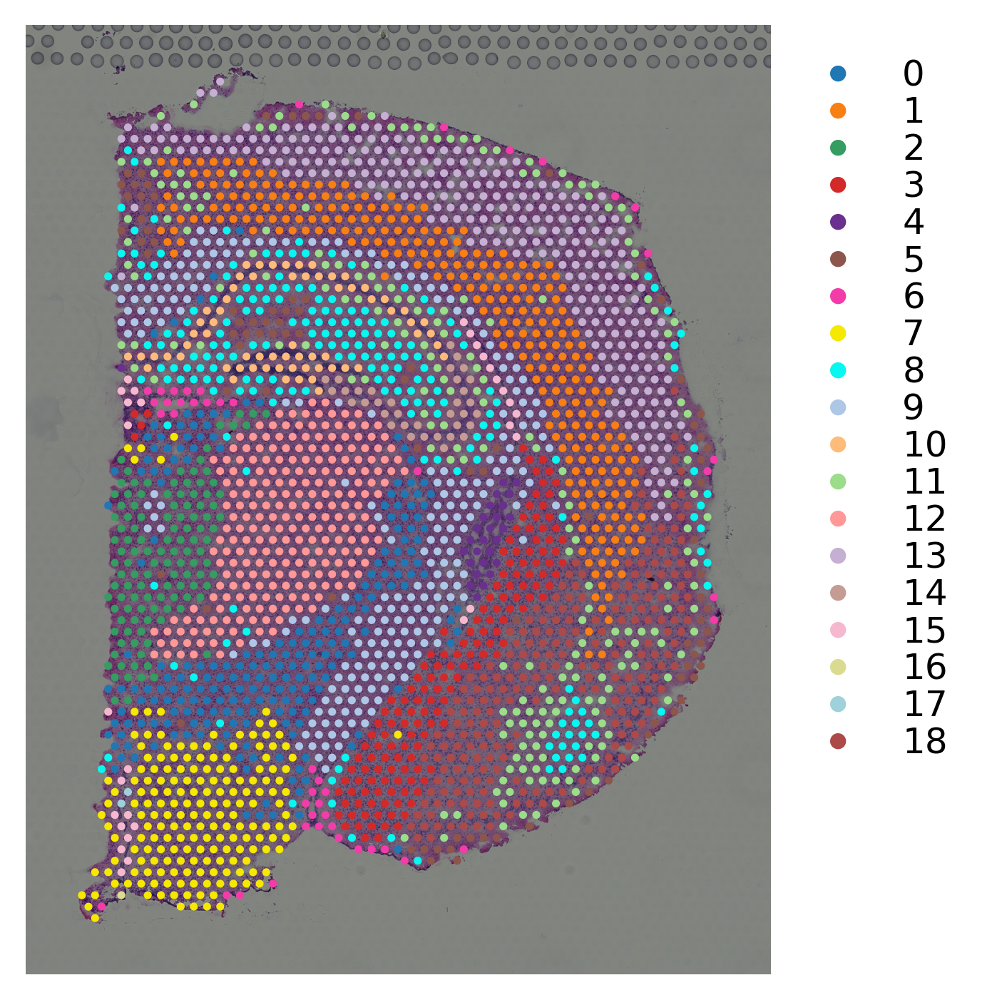

In [8]:
st.tl.clustering.kmeans(data_SME,n_clusters=19, use_data="X_pca", key_added="X_pca_kmeans")
st.pl.cluster_plot(data_SME, use_label="X_pca_kmeans")

c:\Users\rdbra\anaconda3\envs\stlearn\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
Applying Louvain cluster ...
Louvain cluster is done! The labels are stored in adata.obs['louvain']


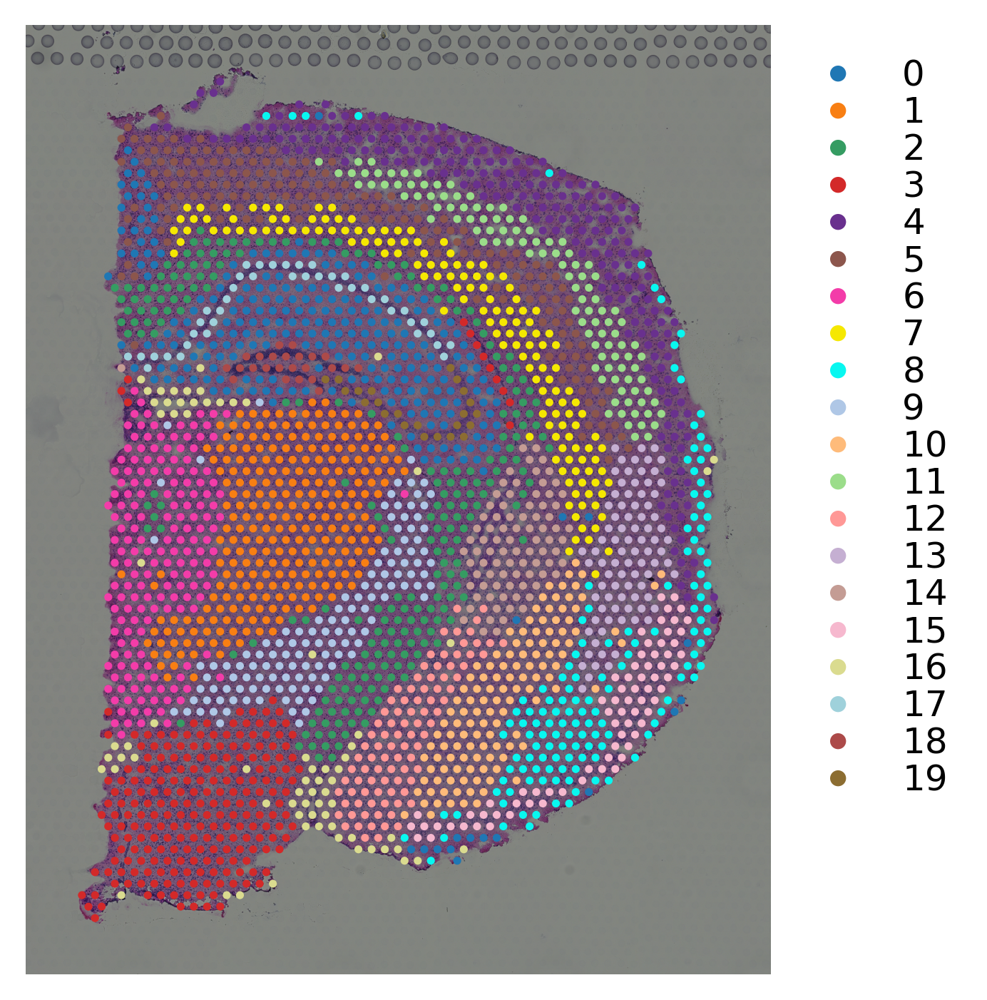

In [9]:
# louvain clustering on stSME normalised data
st.pp.neighbors(data_SME,n_neighbors=17,use_rep='X_pca')
st.tl.clustering.louvain(data_SME, resolution=1.19)
st.pl.cluster_plot(data_SME,use_label="louvain")

## Normalisation

In [10]:
# Duplicate data without SME normalisation
data_normal = data.copy()

# Create SME normalised data set
data_SME = data.copy()
# apply stSME to normalise log transformed data
st.spatial.SME.SME_normalize(data_SME, use_data="raw")
data_SME.X = data_SME.obsm['raw_SME_normalized']
st.em.run_pca(data_SME,n_comps=50)

Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by SME is added to adata.obsm['raw_SME_normalized']
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


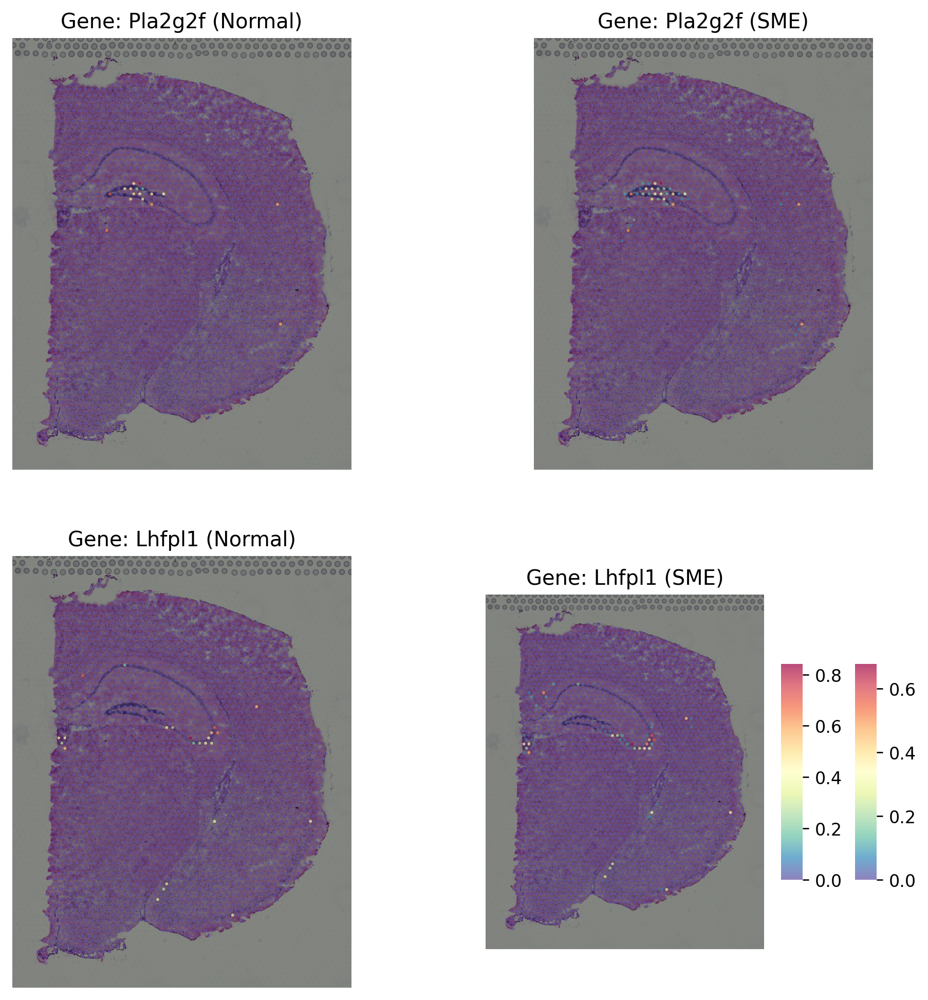

In [50]:

import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Plot the first gene
i = "Pla2g2f"
st.pl.gene_plot(data_normal, gene_symbols=i, size=3, figsize=(10,10), ax=axes[0, 0])
st.pl.gene_plot(data_SME, gene_symbols=i, size=3,figsize=(10,10),ax=axes[0, 1])
axes[0, 0].set_title(f"Gene: {i} (Normal)")
axes[0, 1].set_title(f"Gene: {i} (SME)")


# Plot the second gene
i = "Lhfpl1"
st.pl.gene_plot(data_normal, gene_symbols=i, size=3, figsize=(10,10), ax=axes[1,0])
st.pl.gene_plot(data_SME, gene_symbols=i, size=3, figsize=(10,10),ax=axes[1,1])
axes[1, 0].set_title(f"Gene: {i} (Normal)")
axes[1, 1].set_title(f"Gene: {i} (SME)")




## Cell Interaction Analysis

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [13]:
data_path = "C:/Users/rdbra/Documents/honours_2024/code_base/ST_Honours_2024/basicAnalysis/data/V1_Breast_Cancer_Block_A_Section_1"


In [14]:
data = st.Read10X(data_path)
data.var_names_make_unique()
st.add.image(adata=data,
             imgpath=data_path+"/spatial/tissue_hires_image.png",
             library_id="V1_Breast_Cancer_Block_A_Section_1", visium=True)

# Basic normalisation #
st.pp.filter_genes(data, min_cells=3)
st.pp.normalize_total(data) # NOTE: no log1p



c:\Users\rdbra\anaconda3\envs\stlearn\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Added tissue image to the object!
Normalization step is finished in adata.X


In [15]:
lrs = st.tl.cci.load_lrs(['connectomeDB2020_lit'], species='human')
print(len(lrs))

st.tl.cci.run(data, lrs,
                  min_spots = 20, #Filter out any LR pairs with no scores for less than min_spots
                  distance=None, # None defaults to spot+immediate neighbours; distance=0 for within-spot mode
                  n_pairs=100, # Number of random pairs to generate; low as example, recommend ~10,000
                  n_cpus=4, # Number of CPUs for parallel. If None, detects & use all available.
                  )

2293
Calculating neighbours...
0 spots with no neighbours, 6 median spot neighbours.
Spot neighbour indices stored in adata.obsm['spot_neighbours'] & adata.obsm['spot_neigh_bcs'].
Altogether 1548 valid L-R pairs


Generating backgrounds & testing each LR pair...: 100%|██████████ [ time left: 00:00 ]   



Storing results:

lr_scores stored in adata.obsm['lr_scores'].
p_vals stored in adata.obsm['p_vals'].
p_adjs stored in adata.obsm['p_adjs'].
-log10(p_adjs) stored in adata.obsm['-log10(p_adjs)'].
lr_sig_scores stored in adata.obsm['lr_sig_scores'].

Per-spot results in adata.obsm have columns in same order as rows in adata.uns['lr_summary'].
Summary of LR results in adata.uns['lr_summary'].


Updated adata.uns[lr_summary]
Updated adata.obsm[lr_scores]
Updated adata.obsm[lr_sig_scores]
Updated adata.obsm[p_vals]
Updated adata.obsm[p_adjs]
Updated adata.obsm[-log10(p_adjs)]


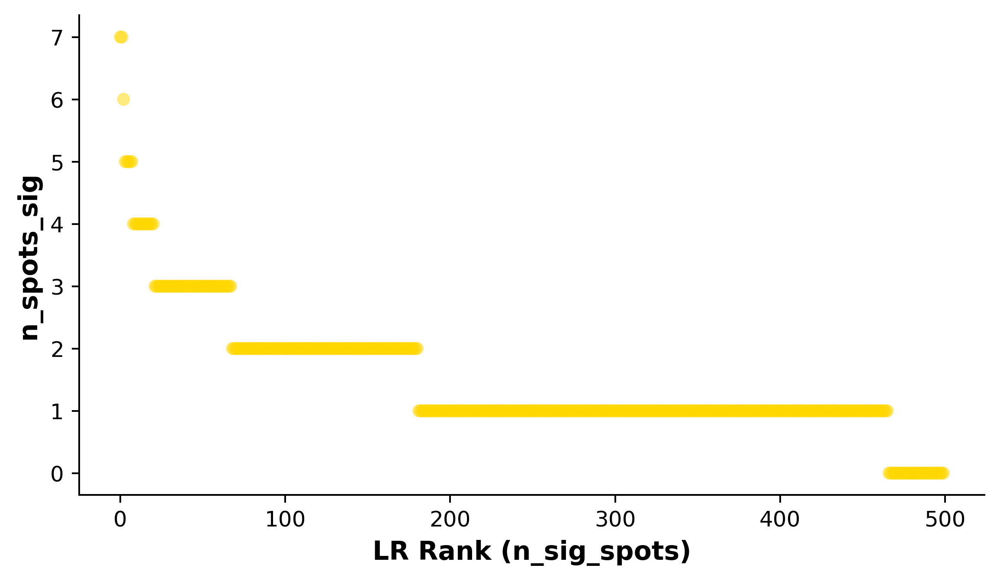

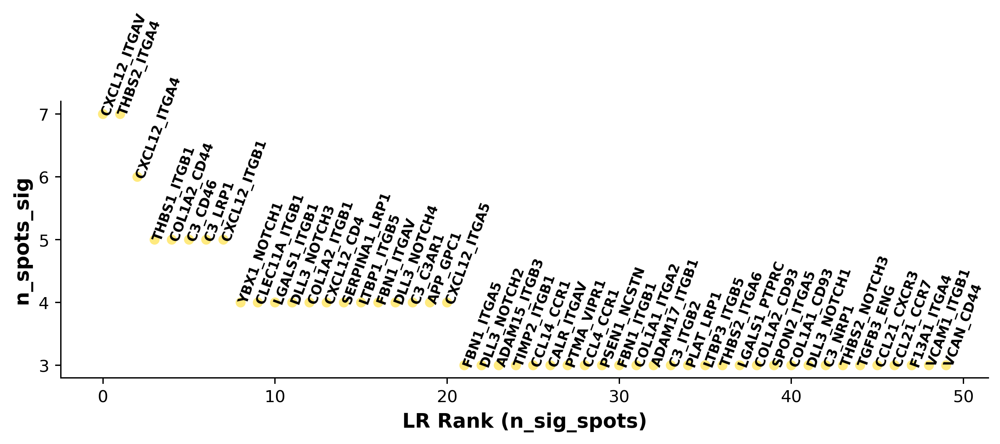

In [16]:
st.tl.cci.adj_pvals(data, correct_axis='spot',
                   pval_adj_cutoff=0.05, adj_method='fdr_bh')
# Showing the rankings of the LR from a global and local perspective.
# Ranking based on number of significant hotspots.
st.pl.lr_summary(data, n_top=500)
st.pl.lr_summary(data, n_top=50, figsize=(10,3))